In [1]:
import sys
import os
module_path = os.path.abspath(os.path.join('..'))
sys.path.append(module_path)

In [2]:
from modules.infererence.preprocessing import *
from modules.infererence.object_detection import Model
from modules.infererence.nms import filter
import matplotlib.pyplot as plt
import cv2
import zipfile
from PIL import Image
from io import BytesIO
import numpy as np

In [3]:
# Load 5 imanges from logistics.zip as examples
zip_file_path = os.path.join('..', 'logistics.zip')
images, image_names = load_images_from_zip(zip_file_path, num_images=5)

for idx, image in enumerate(images):
    print(f"Image {idx} shape: {image.shape}")

Image 0 shape: (640, 640, 3)
Image 1 shape: (640, 640, 3)
Image 2 shape: (640, 640, 3)
Image 3 shape: (640, 640, 3)
Image 4 shape: (640, 640, 3)


In [4]:
# Assign to yolo_version to test 2 YOLO models
yolo_version = 1

yolo_model_folder = f'yolo_model_{yolo_version}'
# Paths to the extracted files
model_config = os.path.join('..', 'yolo_model_1', f'yolov4-tiny-logistics_size_416_{yolo_version}.cfg')
model_weights = os.path.join('..', 'yolo_model_1', f'yolov4-tiny-logistics_size_416_{yolo_version}.weights')
class_names = os.path.join('..', 'yolo_model_1', 'logistics.names')

yolo_model = Model(model_config, model_weights, class_names)

## Displaying Bounding Boxes from predict()

In [5]:
def draw_bboxes_from_raw_predictions(image, predict_output):

    h, w = image.shape[:2]
    
    for output in predict_output:
        for detection in output:
            scores_list = detection[5:]  # Class probabilities
            class_id = np.argmax(scores_list)
            confidence = scores_list[class_id]
            
            if confidence > 0.5:  # Draw only if confidence is above a threshold
                center_x, center_y, box_width, box_height = detection[0:4]
                
                # Convert relative coordinates to absolute pixel values
                top_left_x = int((center_x - box_width / 2) * w)
                top_left_y = int((center_y - box_height / 2) * h)
                bottom_right_x = int((center_x + box_width / 2) * w)
                bottom_right_y = int((center_y + box_height / 2) * h)
                
                # Draw rectangle (bounding box)
                cv2.rectangle(image, (top_left_x, top_left_y), (bottom_right_x, bottom_right_y), (0, 255, 0), 2)
                
                # Put the label (class name) and confidence score
                label = f'Class {class_id}: {confidence:.2f}'
                cv2.putText(image, label, (top_left_x, top_left_y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
    
    return image

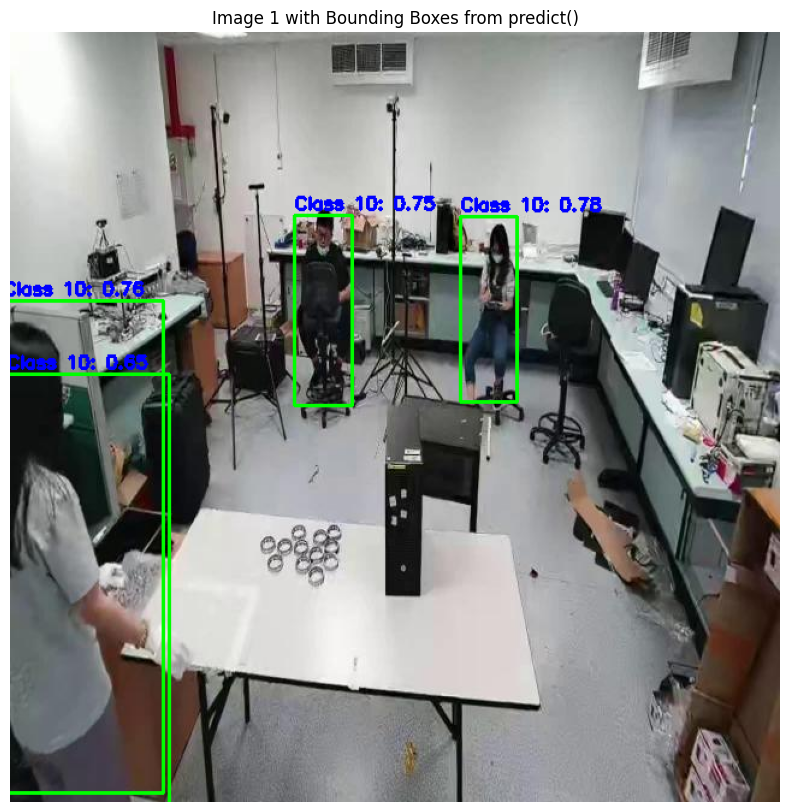

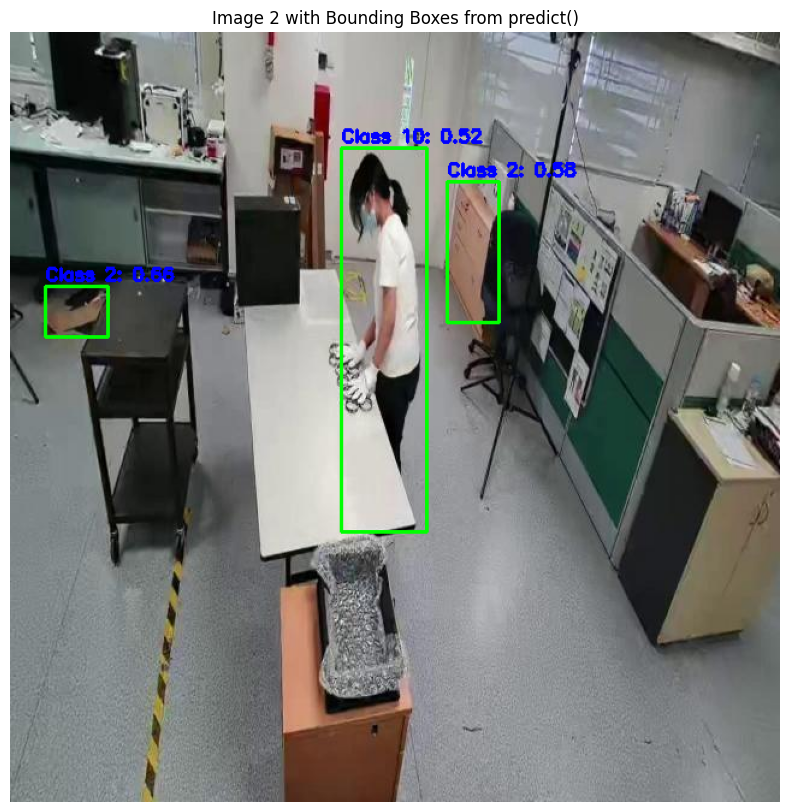

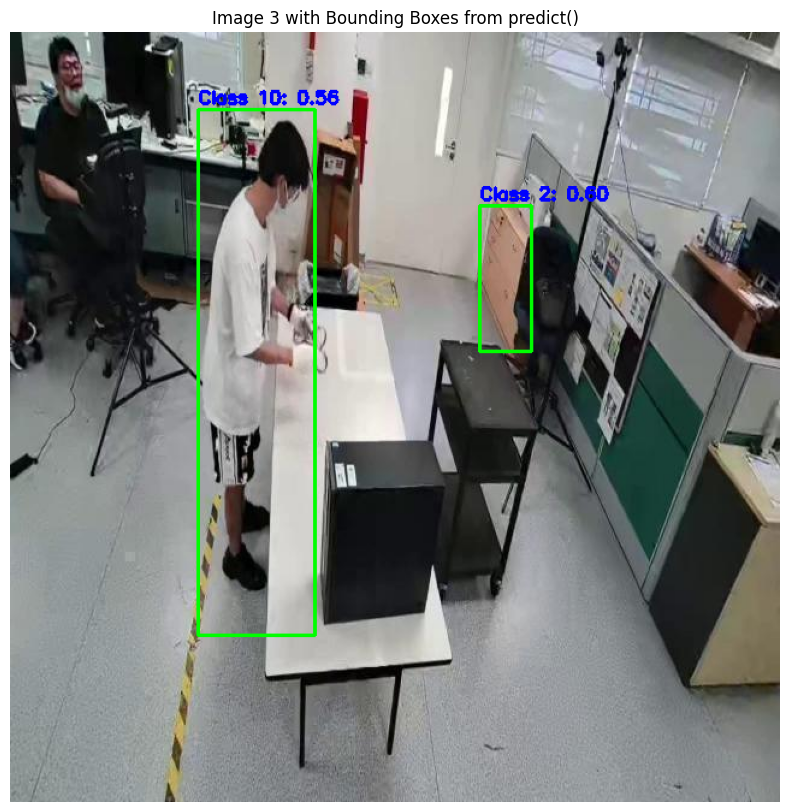

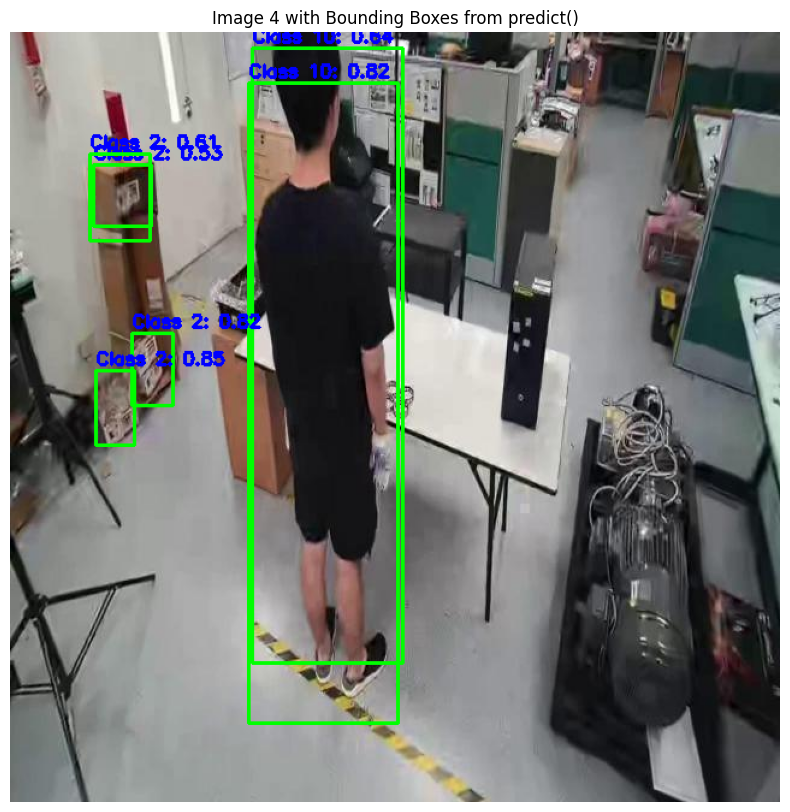

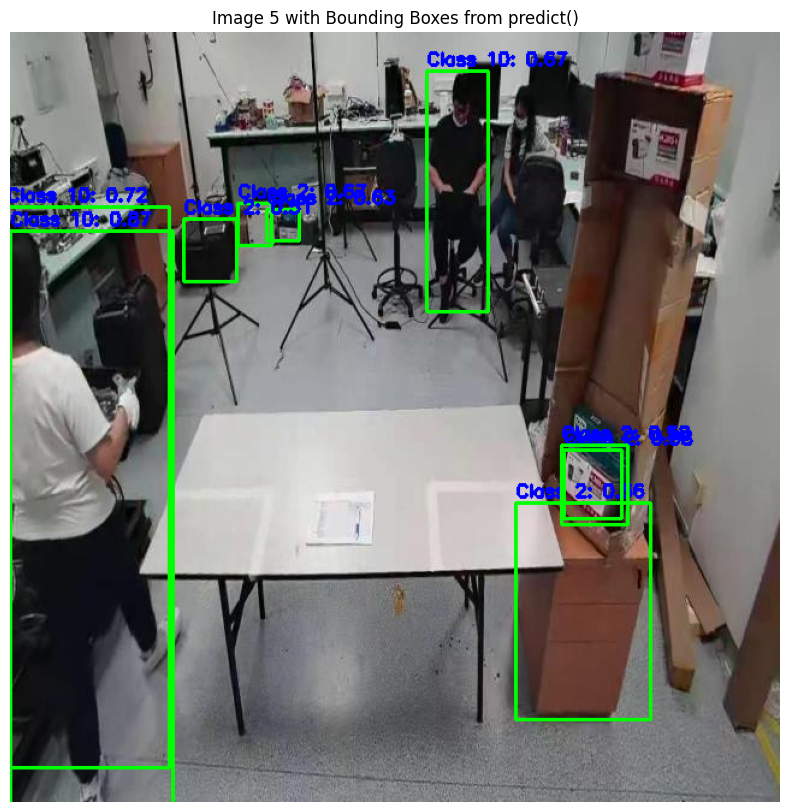

In [6]:
predictions = []
processed_predictions = []

for i, image in enumerate(images):
    # Step 1: Get predictions from the model using predict()
    predict_output = yolo_model.predict(image)
    predictions.append(predict_output)
    
    # Step 2: Draw bounding boxes directly from predictions
    image_with_bboxes_predict = draw_bboxes_from_raw_predictions(image.copy(), predict_output)
    
    # Step 3: Display the image with bounding boxes from predict()
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image_with_bboxes_predict, cv2.COLOR_BGR2RGB))  # Convert from BGR to RGB for Matplotlib
    plt.title(f'Image {i+1} with Bounding Boxes from predict()')
    plt.axis('off')
    plt.show()

## Displaying Bounding Boxes from post_process()

In [7]:
def draw_bboxes_on_image(image, bboxes, class_ids, scores, class_names):
    # Get image dimensions
    h, w = image.shape[:2]
    
    for bbox, class_id, score in zip(bboxes, class_ids, scores):
        center_x, center_y, box_width, box_height = bbox
        
        # Convert relative coordinates to absolute pixel values
        top_left_x = int((center_x - box_width / 2) * w)
        top_left_y = int((center_y - box_height / 2) * h)
        bottom_right_x = int((center_x + box_width / 2) * w)
        bottom_right_y = int((center_y + box_height / 2) * h)
        
        # Draw rectangle (bounding box)
        cv2.rectangle(image, (top_left_x, top_left_y), (bottom_right_x, bottom_right_y), (0, 255, 0), 2)
        
        # Put the label (class name) and confidence score
        label = f'{class_names[class_id]}: {score:.2f}'
        cv2.putText(image, label, (top_left_x, top_left_y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
    
    return image

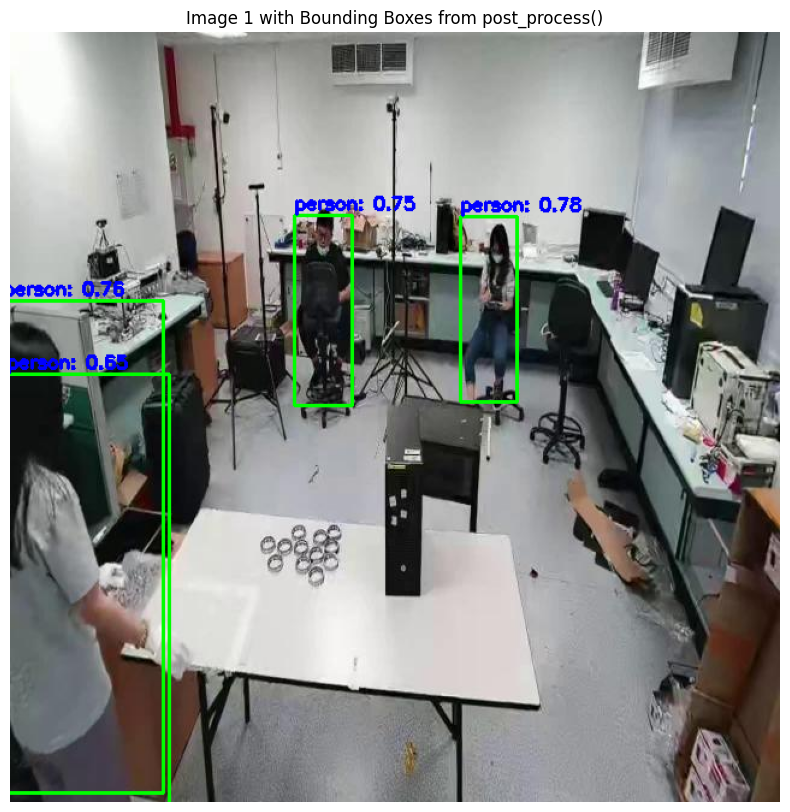

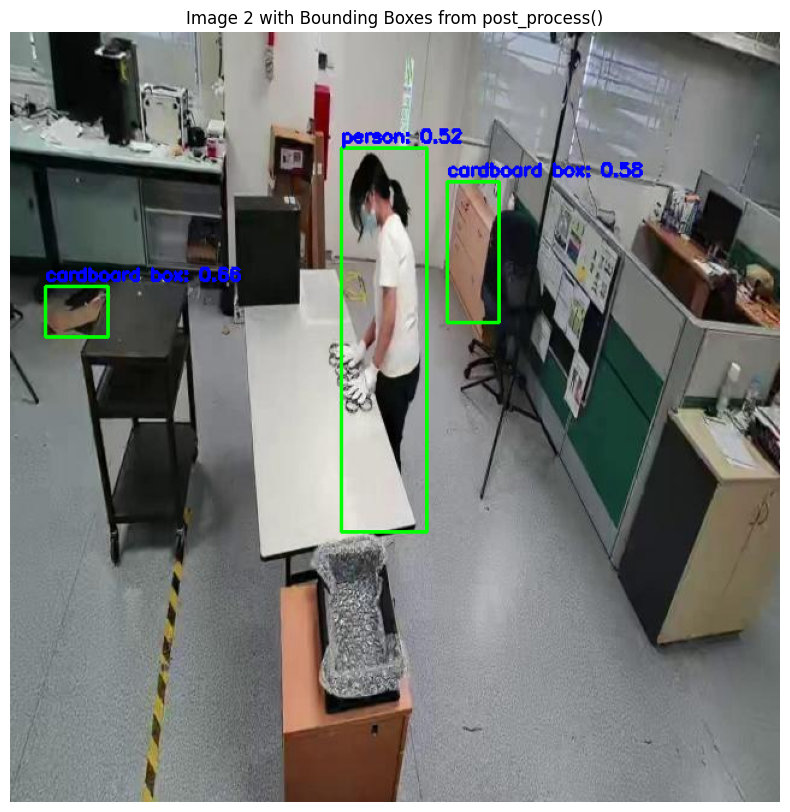

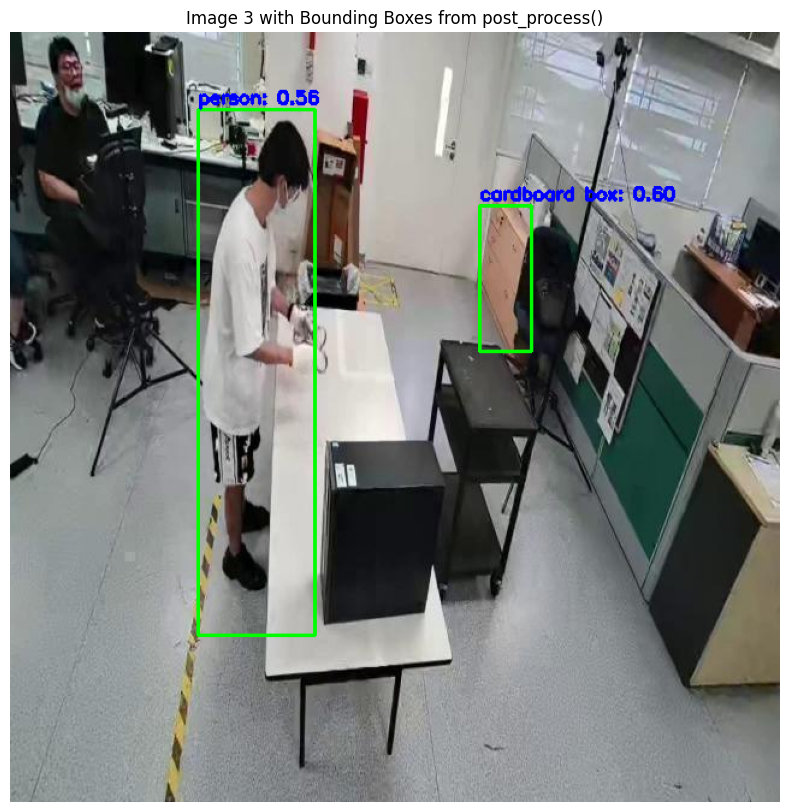

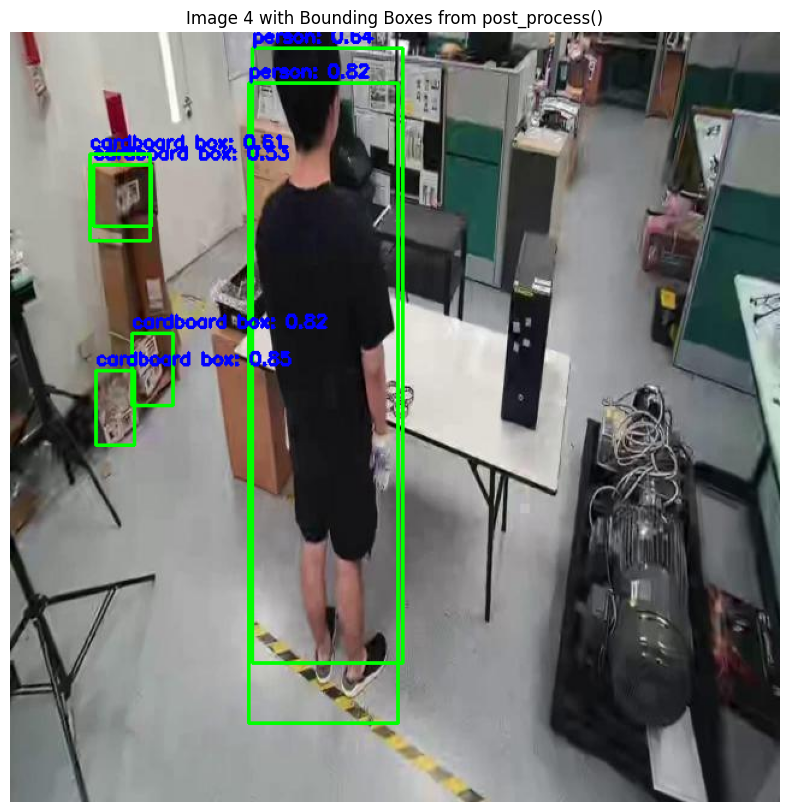

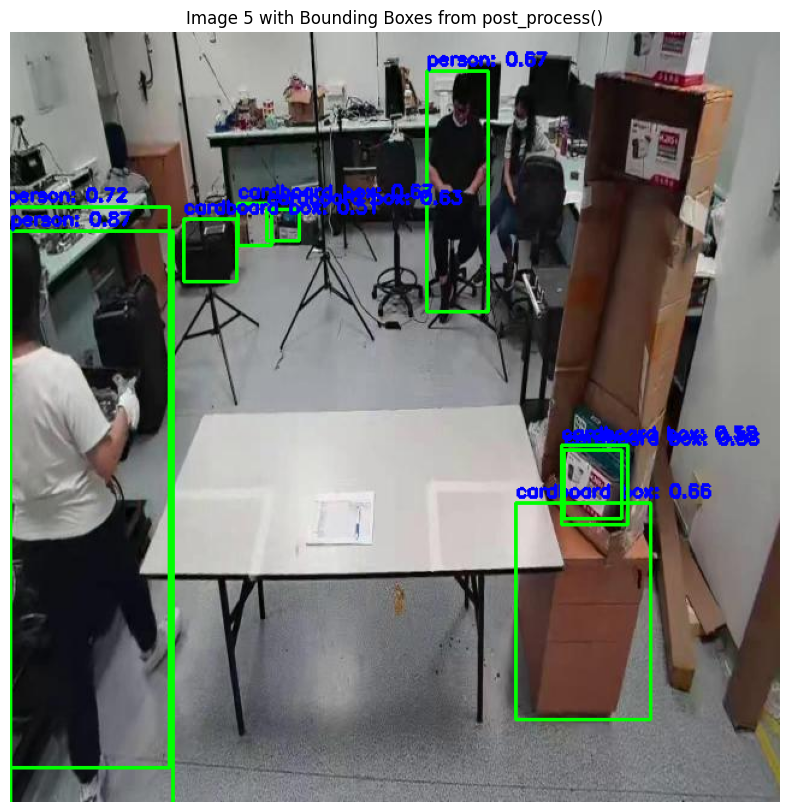

In [8]:
for i, image in enumerate(images):
    # Step 1: Get predictions from the model
    predict_output = yolo_model.predict(image)  # Using the predict method as is
    predictions.append(predict_output)
    
    # Step 2: Apply post-processing to filter and keep one prediction for each class
    processed_bboxes, processed_class_ids, processed_scores = yolo_model.post_process(predict_output, score_threshold=0.5)
    processed_predictions.append((processed_bboxes, processed_class_ids, processed_scores))
    
    # Step 3: Draw bounding boxes on the original image
    image_with_bboxes = draw_bboxes_on_image(image.copy(), processed_bboxes, processed_class_ids, processed_scores, yolo_model.classes)
    
    # Step 4: Display the image with bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image_with_bboxes, cv2.COLOR_BGR2RGB))  # Convert from BGR to RGB for Matplotlib
    plt.title(f'Image {i+1} with Bounding Boxes from post_process()')
    plt.axis('off')
    plt.show()

## Displaying Bounding Boxes from filter()

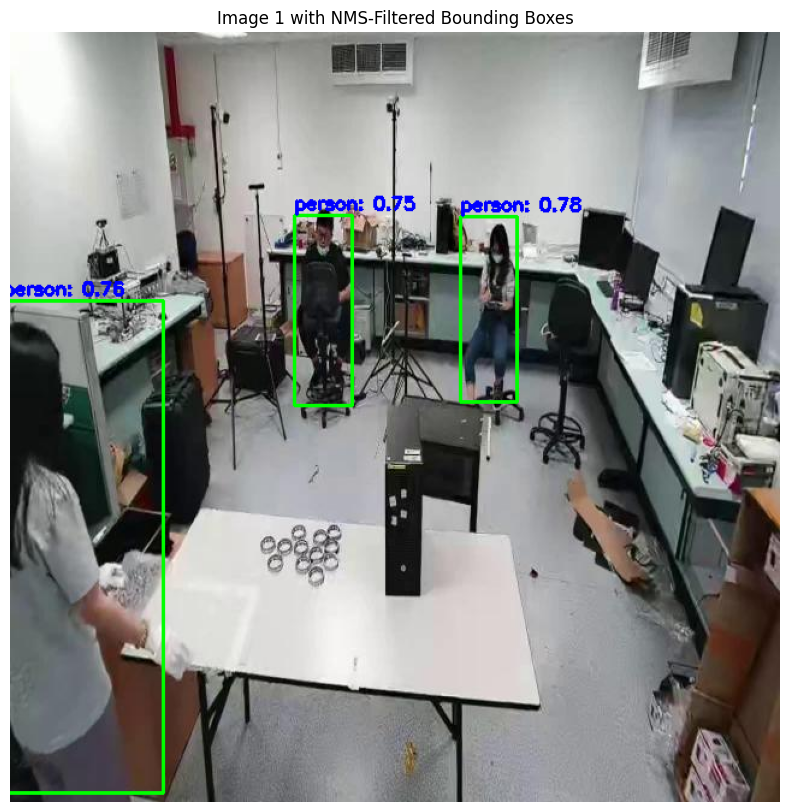

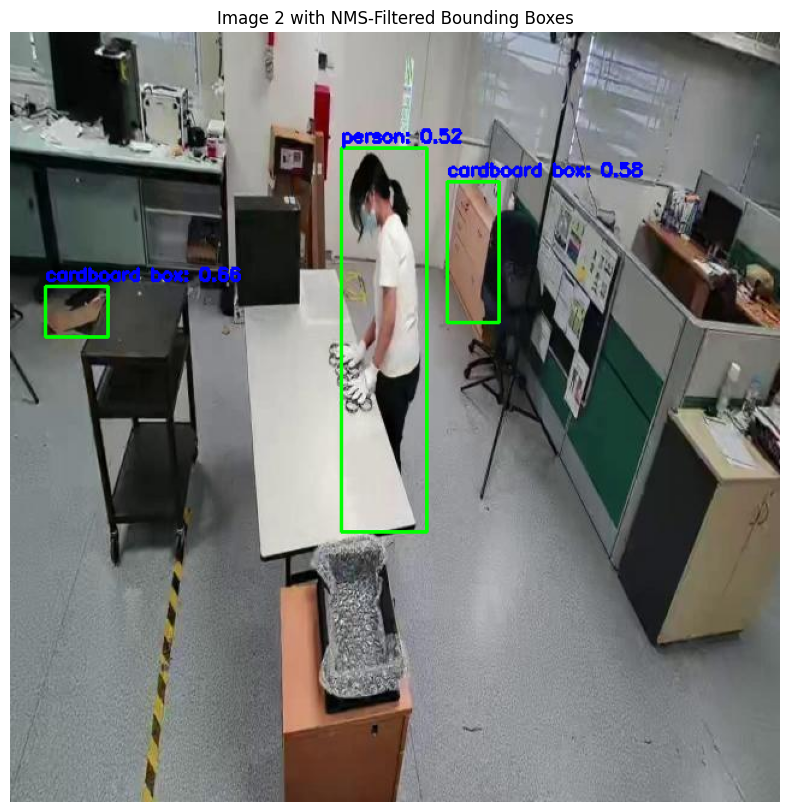

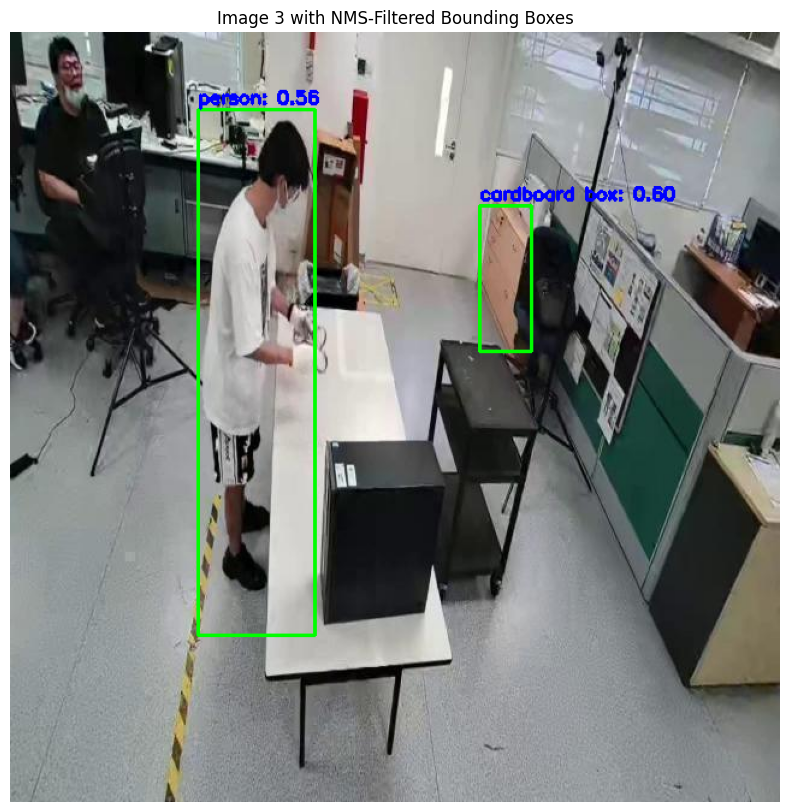

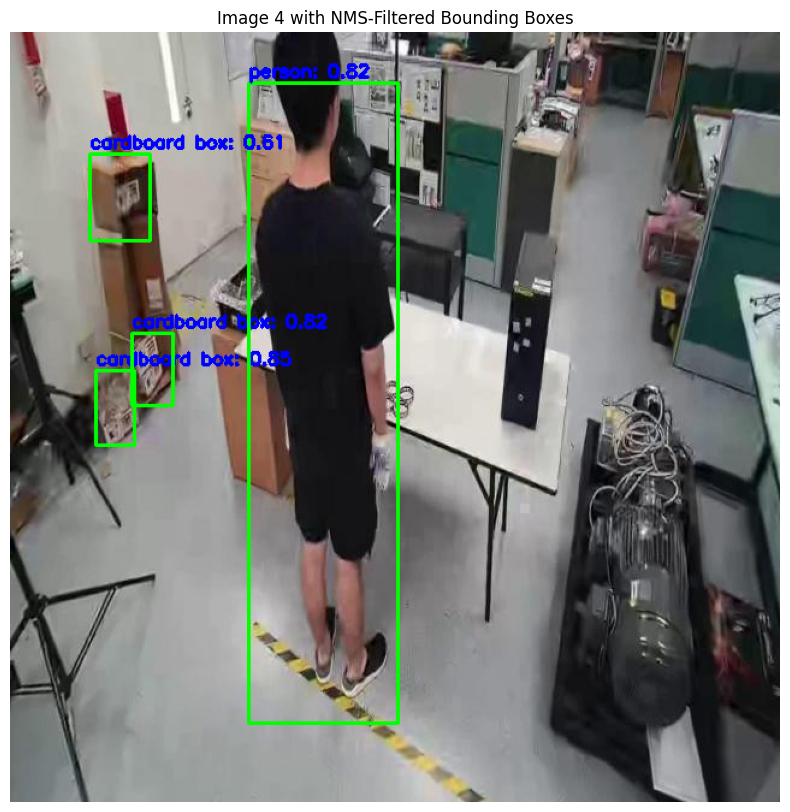

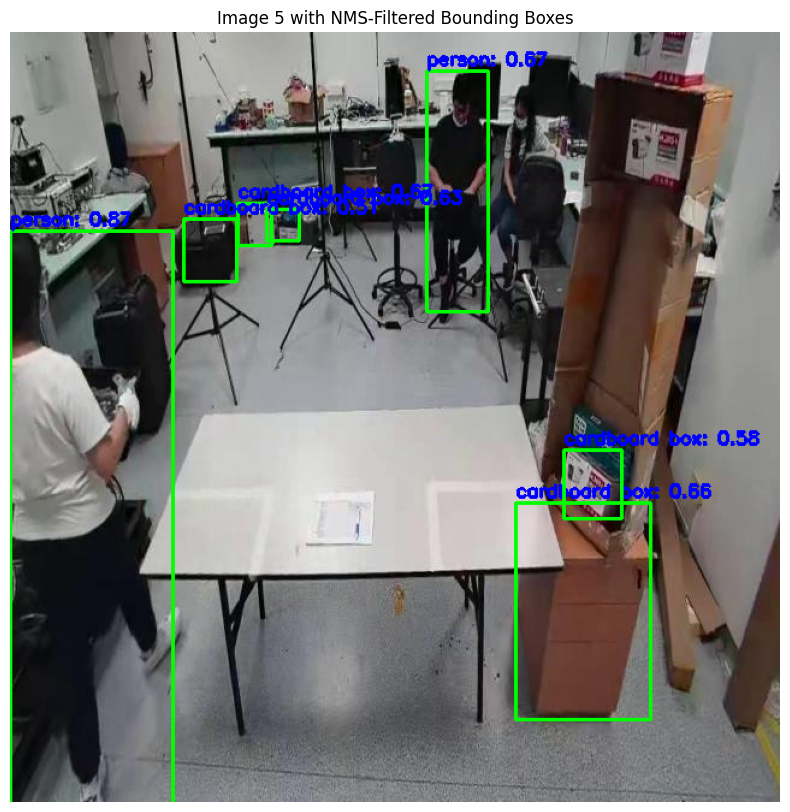

In [9]:
for i, image in enumerate(images):
    # Step 1: Apply NMS on the processed predictions
    processed_bboxes, processed_class_ids, processed_scores = processed_predictions[i]
    nms_bboxes, nms_class_ids, nms_scores = filter(processed_bboxes, processed_class_ids, processed_scores, nms_iou_threshold=0.4)
    
    # Step 2: Draw NMS-filtered bounding boxes on the image
    image_with_nms_bboxes = draw_bboxes_on_image(image.copy(), nms_bboxes, nms_class_ids, nms_scores, yolo_model.classes)
    
    # Step 3: Display the image with NMS-filtered bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image_with_nms_bboxes, cv2.COLOR_BGR2RGB))  # Convert from BGR to RGB for Matplotlib
    plt.title(f'Image {i+1} with NMS-Filtered Bounding Boxes')
    plt.axis('off')
    plt.show()